In [16]:
if os.getenv("MAPBOX_TOKEN") is None:
    print("mapbox token not loaded")

mapbox token not loaded


In [18]:
os.getenv("MAPBOX_TOKEN")

In [2]:
import os

import numpy as np
import pandas as pd

import pandas_profiling

import plotly.express as px
import panel as pn

import matplotlib.pyplot as plt
import seaborn as sns

# configuring the libraries
pn.extension('plotly')
px.set_mapbox_access_token(os.getenv("MAPBOX_TOKEN"))

# 1. Data

From https://www.kaggle.com/dgomonov/new-york-city-airbnb-open-data

## 1.1 Reading and initial parsing of the data

In [20]:
midpoint = (np.average(df["latitude"]), np.average(df["longitude"]))
midpoint

(40.72894888066264, -73.95216961468454)

In [3]:
df = pd.read_csv("AB_NYC_2019.csv")

#df.rename(columns={'neighbourhood_group': 'n_group'}, inplace=True)

# parsing dates and making a year and month col
df['last_review'] = pd.to_datetime(df['last_review'], format="%Y-%m-%d")
df['year'] = df['last_review'].dt.year.astype("Int64")
df['month'] = df['last_review'].dt.month.astype("Int64")
df['day'] = df['last_review'].dt.day.astype("Int64")

df.head(5)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,year,month,day
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365,2018,10,19
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355,2019,5,21
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaT,NaN,1,365,NaN,NaN,NaN
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194,2019,7,5
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0,2018,11,19


## 1.2 Checking NA's

In [4]:
print(df.isna().sum())
f"{df.isna().sum()['last_review'] / df.shape[0]:.2%} of the reviews are missing dates"

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
year                              10052
month                             10052
day                               10052
dtype: int64


'20.56% of the reviews are missing dates'

## 1.3 A more thorough look at the dataset

In [278]:
df.profile_report()

In [296]:
hosts = df.groupby("host_id").count()
hosts.query("name > 1").name.sum() / hosts.name.sum()

0.33938910370506764

In [335]:
one_hosts = hosts.query("name == 1").name.sum()
many_hosts = hosts.query("name > 1").name.count()
many_hosts_listings = hosts.query("name > 1").name.sum()
num_hosts = hosts.shape[0]
num_listings = hosts.name.sum()

print(f"{one_hosts / num_hosts:.2%} ({one_hosts:,}) hosts have only one listing each, out of {num_hosts:,} hosts in total")

print(f"{many_hosts / num_hosts:.2%} ({many_hosts:,}) hosts have {many_hosts_listings:,} or {many_hosts_listings / num_listings:.2%} of the listings")

86.21% (32,290) hosts have only one listing each, out of 37,457 hosts in total
13.76% (5,153) hosts have 16,589 or 33.94% of the listings


<BarContainer object of 2 artists>

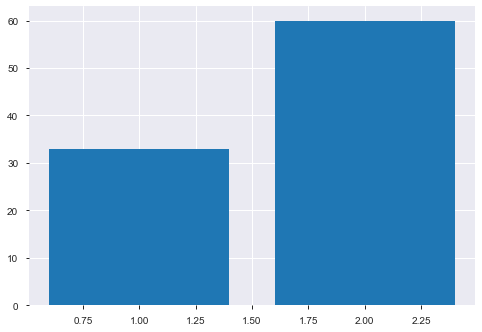

In [329]:
plt.bar(x=[1,2], height=[33, 60])

# 2. EDA

In [5]:
df_n_group = df.groupby("neighbourhood_group").mean()
df_n_group

,availability_365,calculated_host_listings_count,day,host_id,id,last_review,latitude,longitude,minimum_nights,month,number_of_reviews,price,reviews_per_month,year
neighbourhood_group,,,,,,,,,,,,,,
Bronx,165.758937,2.233731,15.468037,1.056099e+08,2.273492e+07,2019-02-26 13:17:15.616436992,40.848305,-73.884552,4.560953,6.077626,26.004583,87.496792,1.837831,2018.695205
Brooklyn,100.232292,2.284371,15.919134,5.671526e+07,1.825685e+07,2018-09-25 17:30:17.839128320,40.685036,-73.951190,6.056556,6.174986,24.202845,124.383207,1.283212,2018.264364
Manhattan,111.979410,12.791330,15.872956,6.783062e+07,1.877494e+07,2018-09-05 02:23:12.207789312,40.765062,-73.974607,8.579151,6.167148,20.985596,196.875814,1.272131,2018.208634
Queens,144.451818,4.060184,15.142326,9.615680e+07,2.175500e+07,2019-01-07 03:09:12.514214400,40.731531,-73.872775,5.181433,6.201574,27.700318,99.517649,1.941200,2018.547661
Staten Island,199.678284,2.319035,14.751592,9.853360e+07,2.159747e+07,2019-04-03 09:47:00.382165504,40.610225,-74.105805,4.831099,6.299363,30.941019,114.812332,1.872580,2018.777070


In [217]:
axes.flatten()

array([<matplotlib.axes._subplots.AxesSubplot object at 0x1405a0a20>,
      dtype=object)

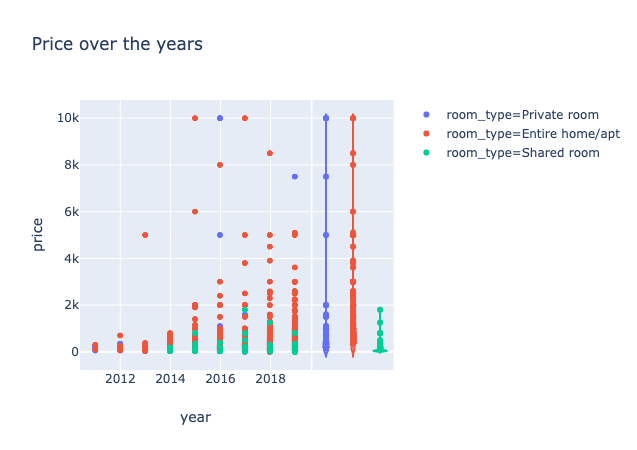

In [345]:
px.scatter(df.dropna(), x="year", y="price", color="room_type", marginal_y="violin", 
          title="Price over the years")

In [6]:
df.sort_values(by="last_review", axis=1).head(10)

KeyError: 'last_review'

In [7]:
px.scatter_mapbox(df.dropna()[:5000], lat='latitude', lon='longitude', 
                  animation_frame="year",  color="neighbourhood_group", 
                  zoom=10,
                  title="Price over years across the different neighbourhoods")

In [357]:
df.query("price > 2000").shape

(86, 19)

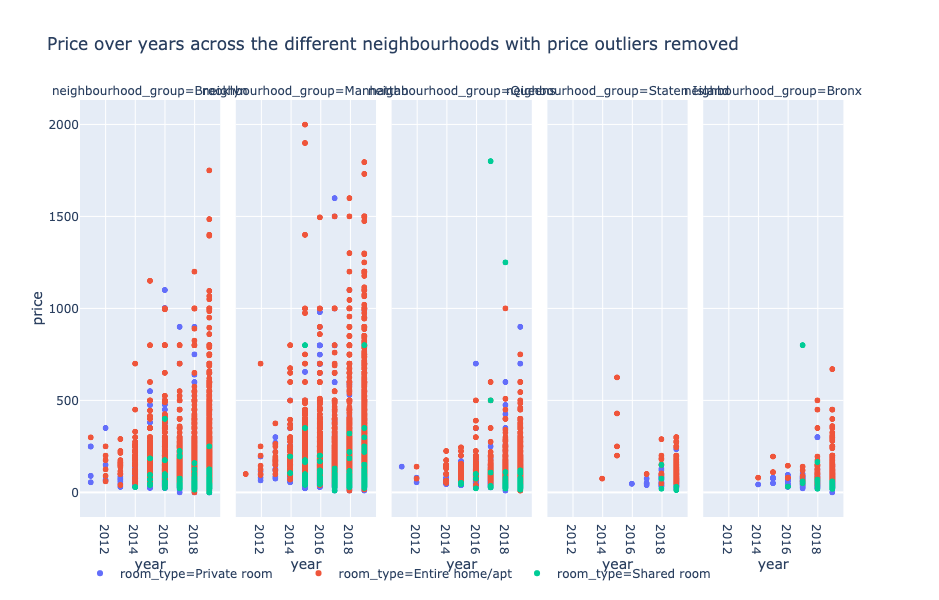

In [14]:
fig = px.scatter(df.query("price < 2000"), x="year", y="price", color="room_type", facet_col="neighbourhood_group",
          title="Price over years across the different neighbourhoods with price outliers removed")

#fig.update_layout({'legend_orientation':'h'})
fig.update_layout(legend_orientation='h')

fig

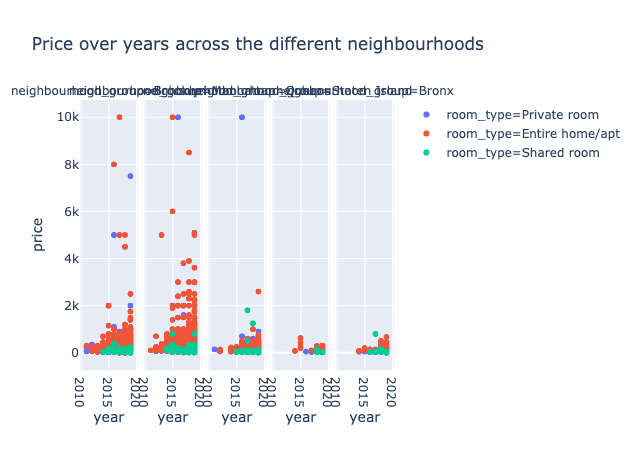

In [341]:
px.scatter(df, x="year", y="price", color="room_type", facet_col="neighbourhood_group", 
          title="Price over years across the different neighbourhoods")

In [424]:
for price in [300, 400, 500, 550, 600,700,800]:
    p = df.query("price > @price").shape[0] / df.shape[0]
    print(f"{price} {p:.2%}")

300 6.87%
400 3.61%
500 2.14%
550 1.91%
600 1.59%
700 1.20%
800 0.86%


In [15]:
hist_kws

NameError: name 'hist_kws' is not defined

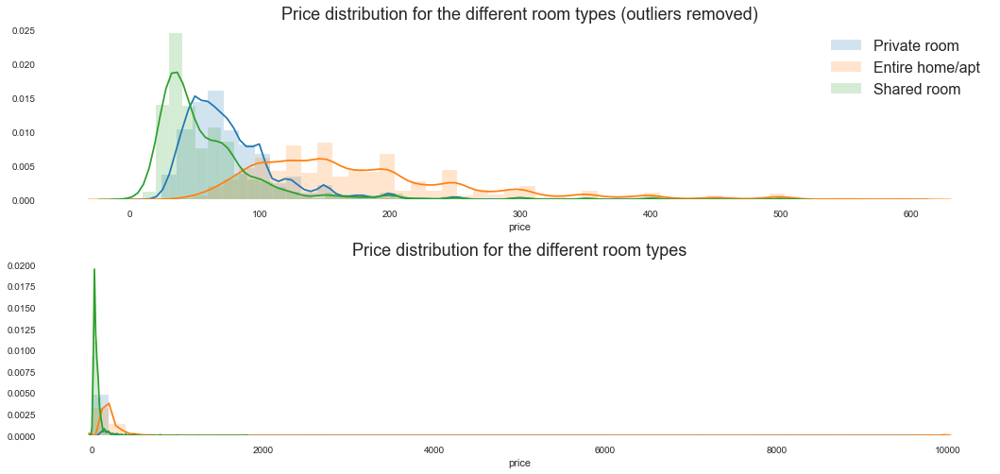

In [415]:
# setting up the plots
fig, (ax, ax1) = plt.subplots(2, 1, figsize=(18,8))
plt.subplots_adjust(hspace=0.35)
sns.set_style("white")

ax.set_title("Price distribution for the different room types (outliers removed)", fontsize=18)

for room in df.room_type.unique():
    dat = df.query("room_type == @room and price<600")
    sns.distplot(dat.price, ax=ax, label=f"{room}", 
                 hist_kws=dict(alpha=0.2))

ax.legend(fontsize=16)

ax1.set_title("Price distribution for the different room types", fontsize=18)

for room in df.room_type.unique():
    dat = df.query("room_type == @room")
    sns.distplot(dat.price, ax=ax1, label=f"{room}", hist_kws=hist_kws)
    
plt.show()

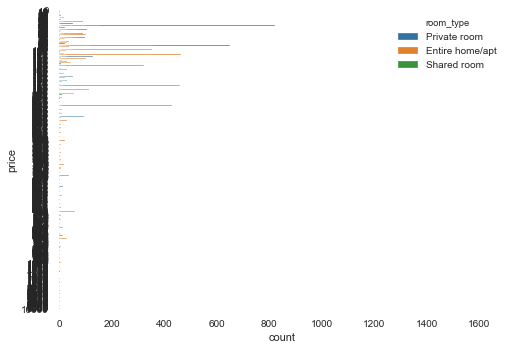

In [426]:
sns.countplot(y="price", hue="room_type", data=df)

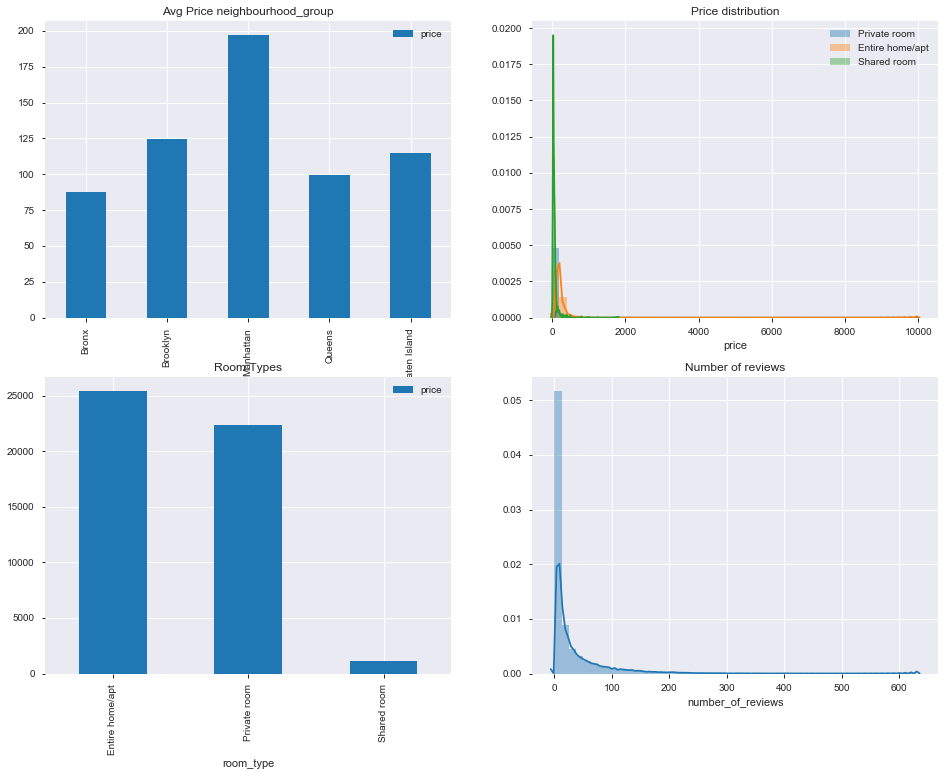

In [372]:
fig, axes = plt.subplots(2,2, figsize=(16,12))
ax, ax1, ax2, ax3 = axes.flatten()

dat = df.groupby("neighbourhood_group").mean()
ax.set_title("Avg Price neighbourhood_group")
dat.plot.bar(y="price", ax=ax)

#dat = df.groupby("neighbourhood").mean()
#ax1.set_title("Avg Price neighbourhood")
#dat.plot.bar(y="price", ax=ax1)

for room in df.room_type.unique():
    dat = df.query("room_type == @room")
    sns.distplot(dat.price, ax=ax1, label=f"{room}")
    
ax1.set_title("Price distribution")
ax1.legend()
#sns.distplot(df.query.price, ax=ax1)

dat = df.groupby("room_type").count()
ax2.set_title("Room Types")
dat.plot.bar(y="price", ax=ax2)

ax3.set_title("Number of reviews")
sns.distplot(df.number_of_reviews, ax=ax3)

plt.show()

In [144]:
df_yr = df.groupby(by="year").mean().reset_index()
df_yr.head()

,year,availability_365,calculated_host_listings_count,day,host_id,id,last_review,latitude,longitude,minimum_nights,month,number_of_reviews,price,reviews_per_month
0,2011,70.714286,4.857143,20.000000,1.066192e+06,4.186871e+04,2011-08-11 06:51:25.714285824,40.723679,-73.946831,2.571429,7.714286,8.714286,169.000000,0.078571
1,2012,153.160000,3.400000,14.080000,1.920423e+06,4.529487e+05,2012-08-27 16:19:12.000000000,40.728985,-73.962917,12.760000,8.440000,7.120000,158.120000,0.070000
2,2013,125.395833,1.270833,11.916667,2.898750e+06,7.166992e+05,2013-07-16 10:00:00.000000000,40.725276,-73.970518,22.062500,7.125000,5.041667,256.208333,0.058125
3,2014,67.211055,1.859296,16.718593,7.872019e+06,2.333206e+06,2014-08-10 03:08:08.442211072,40.731431,-73.960579,15.613065,7.778894,4.683417,160.326633,0.063317
4,2015,30.888011,1.557071,16.297918,1.744874e+07,5.733221e+06,2015-09-01 05:57:40.445082880,40.728431,-73.961962,5.587940,8.518306,4.136396,157.204594,0.069885


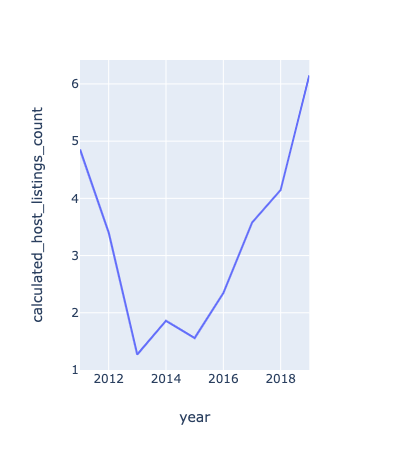

In [145]:
px.scatter(df[:100], x="year", y="calculated_host_listings_count")

In [147]:
df.query("neighbourhood==@n and 100 < price < 110")

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,year,month,day
15270,12226927,"Quiet, cozy and family friendly",38969372,Miki,Brooklyn,Kensington,40.64528,-73.97621,Entire home/apt,105,4,7,2018-08-26,0.18,1,20,2018,8,26


In [50]:
widget = pn.widgets.TextInput(name='A widget', value='A string')
widget

TextInput(name='A widget', value='A string')

In [52]:
widget.value

'A string'

In [67]:
price_widget = pn.widgets.IntRangeSlider(start=0, end=500, step=1, value=(150, 250))
price_widget

IntRangeSlider(end=500, value=(150, 250))

In [71]:
price_widget.param.watch(print, 'value')

Watcher(inst=IntRangeSlider(end=500, value=(150, 250)), cls=<class 'panel.widgets.slider.IntRangeSlider'>, fn=<built-in function print>, mode='args', onlychanged=True, parameter_names=('value',), what='value')

In [156]:
int_range_slider.value

(2, 8)

In [82]:
int_range_slider = pn.widgets.IntRangeSlider(
    name='Integer Range Slider',
    start=0, end=10, value=(2, 8), step=2)

int_range_slider

IntRangeSlider(end=10, name='Integer Range Slider', step=2, value=(2, 8))

In [163]:
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,year,month,day
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365,2018,10,19
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355,2019,5,21
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaT,NaN,1,365,NaN,NaN,NaN
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194,2019,7,5
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0,2018,11,19


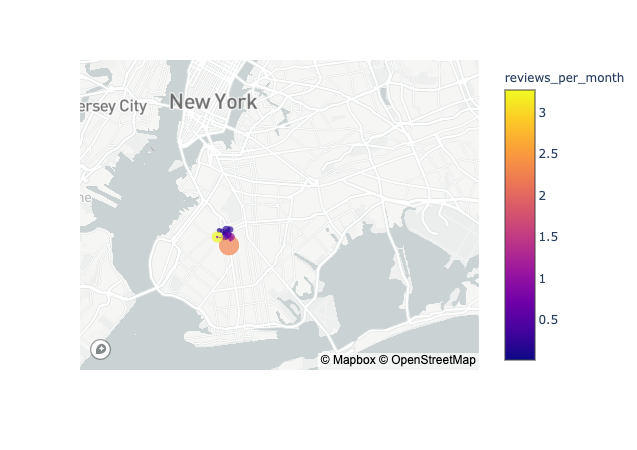

In [170]:
def show_map(n="Kensington", price_low=100, price_high=250, yr=2017, number_of_reviews=10):
    
    data = df.query("neighbourhood==@n and @price_low < price < @price_high")
   
    if data.shape[0] < 1:
        return "Query matches no rows"
    
    fig = px.scatter_mapbox(data, lat='latitude', lon='longitude', size='number_of_reviews', color='reviews_per_month', 
                   size_max=15, zoom=10)
    return fig
    
show_map()

In [19]:
px.scatter_mapbox(df_small, lat='latitude', lon='longitude', size='number_of_reviews', color='reviews_per_month', 
                   size_max=15, zoom=10, width=1000, height=600)

NameError: name 'df_small' is not defined